In [1]:
import geopandas as gpd
from elasticsearch import Elasticsearch
import pandas as pd
from shapely.geometry import shape
import json
import os
from dotenv import load_dotenv
import requests
from datetime import datetime, timedelta
import matplotlib.pyplot as plt

In [5]:
def get_health():
    url = f"http://localhost:9090/health/get-health"
    response = requests.get(url)
    j = response.json()
    if j['ok']:
        return j.get('json_data', 0)
    else:
        return None

In [6]:
data = get_health()

In [7]:
# Create a DataFrame
df = pd.DataFrame(data)

# Convert the dictionary in the geometry column to geometric objects
df["geometry"] = df["geometry"].apply(lambda x: shape(x))

# Convert DataFrame to GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry="geometry")

In [8]:
geoJSON = gdf[['sa2_code_0', 'geometry']].drop_duplicates('sa2_code_0').to_json()
print(geoJSON[:300])

{"type": "FeatureCollection", "features": [{"id": "0", "type": "Feature", "properties": {"sa2_code_0": "206011109"}, "geometry": {"type": "Polygon", "coordinates": [[[144.932641059999, -37.7422639999991], [144.932505059999, -37.7422660199991], [144.931951059999, -37.7422750299991], [144.931829039999


In [9]:
def get_air_quality(location, date, days):
    url = f"http://localhost:9090/air-quality/air-quality-avg/{location}/{date}/{days}"
    headers = {
        "X-Fission-Params-Location": location,
        "X-Fission-Params-Date": date,
        "X-Fission-Params-Days": days
    }
    response = requests.get(url, headers=headers)
    j = response.json()
    if j["ok"]:
        return j.get("avg_BPM25", 0)
    else:
        return None

In [10]:
stations = {
    "Alphington": {"lat": -37.7784081, "lon": 145.0306},
    "Box": {"lat": -37.8287277, "lon": 145.1324},
    "Brighton": {"lat": -37.9135475, "lon": 144.998},
    "Campbellfield": {"lat": -37.679276, "lon": 144.965717},
    "Footscray": {"lat": -37.80488, "lon": 144.8728},
    "Melbourne": {"lat": -37.8073959, "lon": 144.97},
    "Melton": {"lat": -37.7064552, "lon": 144.5669},
}

In [11]:
year_avg = []
for station, coords in stations.items():
    avg_pm25 = get_air_quality(station, "2021-01-01", '365')
    year_avg.append({"Station": station, "Lat": coords["lat"], "Lon": coords["lon"], "Avg_PM25": avg_pm25})
year_avg

[{'Station': 'Alphington',
  'Lat': -37.7784081,
  'Lon': 145.0306,
  'Avg_PM25': 6.650529991392611},
 {'Station': 'Box',
  'Lat': -37.8287277,
  'Lon': 145.1324,
  'Avg_PM25': 4.017155193699172},
 {'Station': 'Brighton',
  'Lat': -37.9135475,
  'Lon': 144.998,
  'Avg_PM25': 5.389776417393145},
 {'Station': 'Campbellfield',
  'Lat': -37.679276,
  'Lon': 144.965717,
  'Avg_PM25': 5.303868534724002},
 {'Station': 'Footscray',
  'Lat': -37.80488,
  'Lon': 144.8728,
  'Avg_PM25': 6.351671965642041},
 {'Station': 'Melbourne',
  'Lat': -37.8073959,
  'Lon': 144.97,
  'Avg_PM25': 6.265747267722425},
 {'Station': 'Melton',
  'Lat': -37.7064552,
  'Lon': 144.5669,
  'Avg_PM25': 5.337942759753811}]

In [12]:
year_avg_df = pd.DataFrame(year_avg)
# Replace 'Box' with 'Box Hill' in the Station column
year_avg_df['Station'] = year_avg_df['Station'].replace('Box', 'Box Hill')
year_avg_df

,Station,Lat,Lon,Avg_PM25
0,Alphington,-37.778408,145.030600,6.650530
1,Box Hill,-37.828728,145.132400,4.017155
2,Brighton,-37.913547,144.998000,5.389776
3,Campbellfield,-37.679276,144.965717,5.303869
4,Footscray,-37.804880,144.872800,6.351672
5,Melbourne,-37.807396,144.970000,6.265747
6,Melton,-37.706455,144.566900,5.337943


In [13]:
def get_monthly_averages(station):
    monthly_averages = []
    for month in range(1, 13):  # Loop from January to December
        date = f"2021-{month:02d}-01"  # Format date as YYYY-MM-DD
        avg_pm25 = get_air_quality(station, date, '30')  # Assume each month has 30 days for simplicity
        monthly_averages.append(avg_pm25)
    return monthly_averages

In [14]:
# Get monthly averages for Melbourne for the year 2021
melbourne_monthly_averages = get_monthly_averages("Melbourne")

# Print the result
print(melbourne_monthly_averages)

[5.802952449815673, 5.495843375376594, 6.0471806882904104, 7.936142273656115, 8.344503500624151, 6.299205604297193, 5.430513887271648, 5.672990195875784, 5.097335654168201, 5.954653411097255, 6.615806403825407, 7.019027295046025]


In [15]:
def get_rainfall(date):
    url = f"http://localhost:9090/bom-past-rainfall/rainfall/{date}"
    headers = {"X-Fission-Params-Date": date}
    response = requests.get(url, headers=headers)
    j = response.json()
    if j['ok']:
        return j.get('rainfall_amount', 0)
    else:
        return None

In [16]:
from datetime import datetime, timedelta

def get_monthly_rainfall_averages(start_date, end_date):
    current_date = datetime.strptime(start_date, "%Y-%m-%d")
    end_date = datetime.strptime(end_date, "%Y-%m-%d")
    
    monthly_rainfalls = []  # List to store monthly averages
    while current_date <= end_date:
        month_start = current_date
        month_end = (month_start.replace(day=28) + timedelta(days=4)).replace(day=1) - timedelta(days=1)  # Find last day of the current month
        if month_end > end_date:
            month_end = end_date

        total_rainfall = 0
        days_count = 0
        while current_date <= month_end:
            daily_rainfall = get_rainfall(current_date.strftime("%Y-%m-%d"))
            if daily_rainfall is not None:
                total_rainfall += daily_rainfall
            days_count += 1
            current_date += timedelta(days=1)
        
        # Calculate the average rainfall for the month
        if days_count > 0:
            average_rainfall = total_rainfall / days_count
        else:
            average_rainfall = 0  # Avoid division by zero

        monthly_rainfalls.append(average_rainfall)
    
    return monthly_rainfalls

# Get monthly rainfall averages from April 2023 to April 2024
monthly_rainfall_averages = get_monthly_rainfall_averages("2023-04-01", "2024-04-01")

# Print the result
print(monthly_rainfall_averages)

[3.62, 2.509677419354839, 1.7600000000000002, 0.6645161290322581, 0.7225806451612903, 0.36000000000000004, 2.451612903225807, 1.413333333333333, 2.3032258064516125, 3.5096774193548392, 0.21379310344827585, 0.0903225806451613, 0.0]


In [17]:
# remove 2024-04-01, rearrange avg_rainfall by month 1-12
monthly_rainfall_avg_13 = monthly_rainfall_averages[-4:-1]
monthly_rainfall_avg_412 = monthly_rainfall_averages[0:9]
monthly_rainfall_avg_sort = monthly_rainfall_avg_13 + monthly_rainfall_avg_412
monthly_rainfall_avg_sort

[3.5096774193548392,
 0.21379310344827585,
 0.0903225806451613,
 3.62,
 2.509677419354839,
 1.7600000000000002,
 0.6645161290322581,
 0.7225806451612903,
 0.36000000000000004,
 2.451612903225807,
 1.413333333333333,
 2.3032258064516125]

<function matplotlib.pyplot.grid(visible=None, which='major', axis='both', **kwargs)>

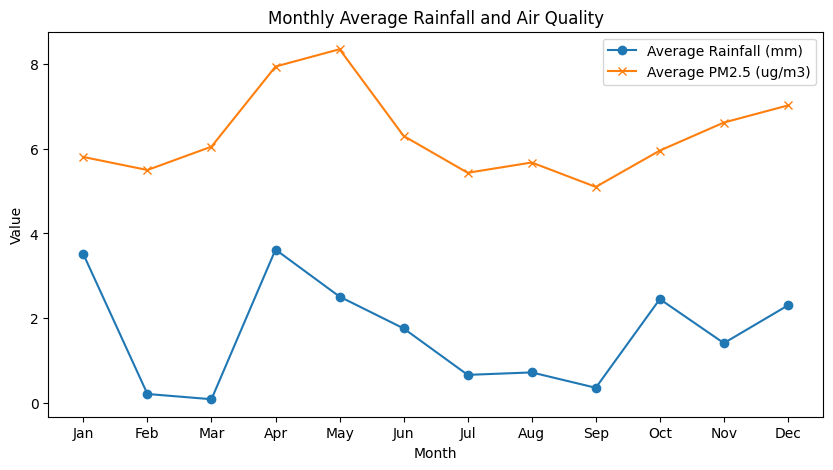

In [18]:
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Create a figure and axis object
plt.figure(figsize=(10, 5))
plt.plot(months, monthly_rainfall_avg_sort, label='Average Rainfall (mm)', marker='o')
plt.plot(months, melbourne_monthly_averages, label='Average PM2.5 (ug/m3)', marker='x')

# Adding labels and title
plt.xlabel('Month')
plt.ylabel('Value')
plt.title('Monthly Average Rainfall and Air Quality')

# Add a legend
plt.legend()

# Show the plot
plt.grid

In [19]:
import folium

In [20]:
m_asthma = folium.Map(location=[-37.82, 144.96], tiles="cartodb positron", zoom_start=10)

# refer to the folium documentations on more information on how to plot aggregated data.
c_asthma = folium.Choropleth(
    geo_data=geoJSON, # geoJSON 
    name='choropleth', # name of plot
    data=gdf.reset_index(), # data source
    columns=['sa2_code_0','asthma_count'], # the columns required
    key_on='properties.sa2_code_0', # this is from the geoJSON's properties
    fill_color='YlGnBu', # color scheme
    nan_fill_color='black',
    legend_name='Asthma Count in SA2 area'
)

c_asthma.add_to(m_asthma)

for _, row in year_avg_df.iterrows():
    folium.Marker(
        location=[row["Lat"], row["Lon"]],
        popup=f"{row['Station']}: {row['Avg_PM25']}",
        icon=folium.Icon(color="blue", icon="info-sign")
    ).add_to(m_asthma)

m_asthma.save('Map_Asthma.html')

m_asthma

In [21]:
m_copd = folium.Map(location=[-37.82, 144.96], tiles="cartodb positron", zoom_start=10)

# refer to the folium documentations on more information on how to plot aggregated data.
c_copd = folium.Choropleth(
    geo_data=geoJSON, # geoJSON 
    name='choropleth', # name of plot
    data=gdf.reset_index(), # data source
    columns=['sa2_code_0','copd_count'], # the columns required
    key_on='properties.sa2_code_0', # this is from the geoJSON's properties
    fill_color='YlOrRd', # color scheme
    nan_fill_color='black',
    legend_name='COPD Count in SA2 area'
)

c_copd.add_to(m_copd)

for _, row in year_avg_df.iterrows():
    folium.Marker(
        location=[row["Lat"], row["Lon"]],
        popup=f"{row['Station']}: {row['Avg_PM25']}",
        icon=folium.Icon(color="blue", icon="info-sign")
    ).add_to(m_copd)
    
m_copd.save('Map_COPD.html')

m_copd